In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import nltk
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
pd.options.display.max_rows =9999
# TENSORFLOW
import tensorflow as tf
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical

import warnings
warnings.filterwarnings("ignore")

In [24]:
stock = pd.read_csv('C:/Users/OFFICE/Data_visualization/Stock_News_prediction_Using_NLP/stock_sentiment.csv')

In [25]:
stock

,Text,Sentiment
0,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...,1
1,user: AAP MOVIE. 55% return for the FEA/GEED i...,1
2,user I'd be afraid to short AMZN - they are lo...,1
3,MNTA Over 12.00,1
4,OI Over 21.37,1
5,PGNX Over 3.04,1
6,AAP - user if so then the current downtrend wi...,0
7,Monday's relative weakness. NYX WIN TIE TAP IC...,0
8,GOOG - ower trend line channel test & volume s...,1
9,AAP will watch tomorrow for ONG entry.,1


In [26]:
stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5791 entries, 0 to 5790
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Text       5791 non-null   object
 1   Sentiment  5791 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 90.6+ KB


In [27]:
stock.isnull().sum()

Text         0
Sentiment    0
dtype: int64

In [28]:
stock['Sentiment'].unique()

array([1, 0], dtype=int64)

<Axes: ylabel='count'>

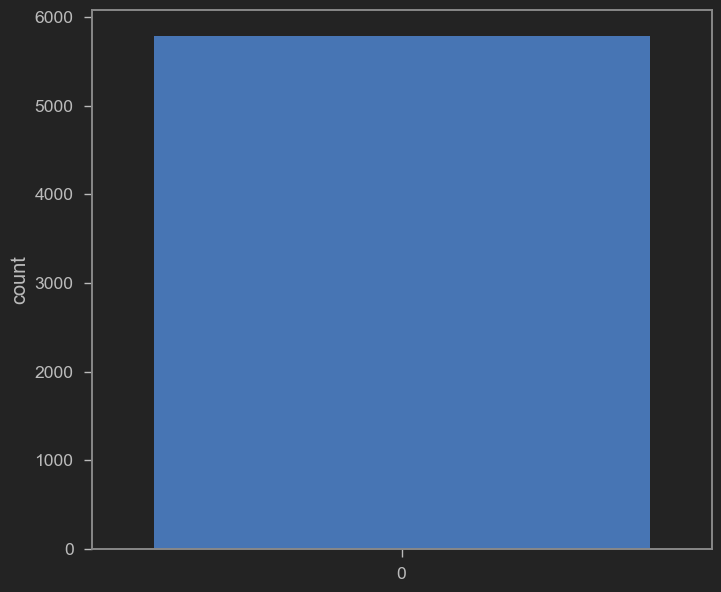

In [30]:
sns.countplot(stock['Sentiment'])

# Data cleaning

In [31]:
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [37]:
def remove_function(message):
    Test_punctuation_removed = [char for char in message if char not in string .punctuation]
    Test_punctuation_removed_join = ''.join(Test_punctuation_removed)
    
    return Test_punctuation_removed_join

In [38]:
stock['Text-Without-Punctuations'] = stock['Text'].apply(remove_function)


In [39]:
stock

,Text,Sentiment,Text-Without-Punctuations
0,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...,1,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...
1,user: AAP MOVIE. 55% return for the FEA/GEED i...,1,user AAP MOVIE 55 return for the FEAGEED indic...
2,user I'd be afraid to short AMZN - they are lo...,1,user Id be afraid to short AMZN they are look...
3,MNTA Over 12.00,1,MNTA Over 1200
4,OI Over 21.37,1,OI Over 2137
5,PGNX Over 3.04,1,PGNX Over 304
6,AAP - user if so then the current downtrend wi...,0,AAP user if so then the current downtrend wil...
7,Monday's relative weakness. NYX WIN TIE TAP IC...,0,Mondays relative weakness NYX WIN TIE TAP ICE ...
8,GOOG - ower trend line channel test & volume s...,1,GOOG ower trend line channel test volume sup...
9,AAP will watch tomorrow for ONG entry.,1,AAP will watch tomorrow for ONG entry


In [40]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\OFFICE\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

In [41]:
stopwords.words('english')

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [51]:
from nltk.corpus import stopwords
stopwords = stopwords.words('english')

# AFTER LOOKING AT THE DATA, IT WAS OBSERVED THAT SOME WORDS WERE FREQUENTLY REPEATED, THUS ADDING THEM IN THE STOPWORDS LIST (TO BE REMOVED FROM THE DATASET)
stopwords.extend(['from', 'subject', 'https', 're', 'edu', 'use','will','aap','co','day','user','stock','today','week','year'])

# DEFINING A FUNCTION TO REMOVE STOP WORDS AND SOME SHORT WORDS TOO (LESS THAN 3 CHARACTERS LONG), SINCE THEY DONT GIVE VALUE TO THE DATA

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if len(token) >=3 and token not in stopwords:
            result.append(token)
    return result

In [52]:
stock['Text_Pre-processed'] = stock['Text-Without-Punctuations'].apply(preprocess)

In [53]:
stock

,Text,Sentiment,Text-Without-Punctuations,Text_Pre-processed
0,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...,1,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...,"[kickers, watchlist, xide, tit, soq, pnk, cpw,..."
1,user: AAP MOVIE. 55% return for the FEA/GEED i...,1,user AAP MOVIE 55 return for the FEAGEED indic...,"[movie, return, feageed, indicator, trades, aw..."
2,user I'd be afraid to short AMZN - they are lo...,1,user Id be afraid to short AMZN they are look...,"[afraid, short, amzn, looking, like, nearmonop..."
3,MNTA Over 12.00,1,MNTA Over 1200,[mnta]
4,OI Over 21.37,1,OI Over 2137,[]
5,PGNX Over 3.04,1,PGNX Over 304,[pgnx]
6,AAP - user if so then the current downtrend wi...,0,AAP user if so then the current downtrend wil...,"[current, downtrend, break, otherwise, shortte..."
7,Monday's relative weakness. NYX WIN TIE TAP IC...,0,Mondays relative weakness NYX WIN TIE TAP ICE ...,"[mondays, relative, weakness, nyx, win, tie, t..."
8,GOOG - ower trend line channel test & volume s...,1,GOOG ower trend line channel test volume sup...,"[goog, ower, trend, line, channel, test, volum..."
9,AAP will watch tomorrow for ONG entry.,1,AAP will watch tomorrow for ONG entry,"[watch, tomorrow, ong, entry]"


In [54]:
stock['Text_Pre-processed-joined'] = stock['Text_Pre-processed'].apply(lambda x: " ".join(x))
stock

,Text,Sentiment,Text-Without-Punctuations,Text_Pre-processed,Text_Pre-processed-joined
0,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...,1,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...,"[kickers, watchlist, xide, tit, soq, pnk, cpw,...",kickers watchlist xide tit soq pnk cpw bpz tra...
1,user: AAP MOVIE. 55% return for the FEA/GEED i...,1,user AAP MOVIE 55 return for the FEAGEED indic...,"[movie, return, feageed, indicator, trades, aw...",movie return feageed indicator trades awesome
2,user I'd be afraid to short AMZN - they are lo...,1,user Id be afraid to short AMZN they are look...,"[afraid, short, amzn, looking, like, nearmonop...",afraid short amzn looking like nearmonopoly eb...
3,MNTA Over 12.00,1,MNTA Over 1200,[mnta],mnta
4,OI Over 21.37,1,OI Over 2137,[],
5,PGNX Over 3.04,1,PGNX Over 304,[pgnx],pgnx
6,AAP - user if so then the current downtrend wi...,0,AAP user if so then the current downtrend wil...,"[current, downtrend, break, otherwise, shortte...",current downtrend break otherwise shortterm co...
7,Monday's relative weakness. NYX WIN TIE TAP IC...,0,Mondays relative weakness NYX WIN TIE TAP ICE ...,"[mondays, relative, weakness, nyx, win, tie, t...",mondays relative weakness nyx win tie tap ice ...
8,GOOG - ower trend line channel test & volume s...,1,GOOG ower trend line channel test volume sup...,"[goog, ower, trend, line, channel, test, volum...",goog ower trend line channel test volume support
9,AAP will watch tomorrow for ONG entry.,1,AAP will watch tomorrow for ONG entry,"[watch, tomorrow, ong, entry]",watch tomorrow ong entry


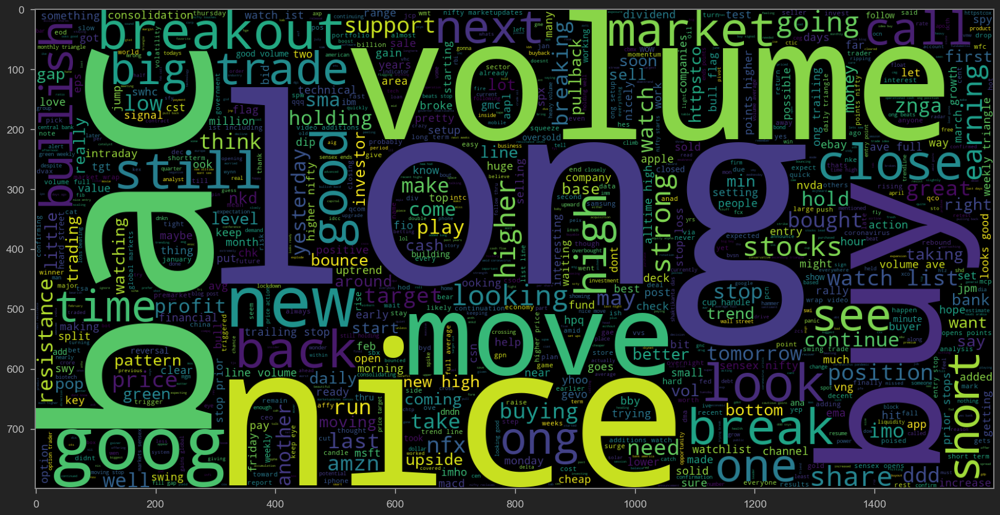

In [56]:
plt.figure(figsize=(20,20))
wc = WordCloud(max_words = 1000, width = 1600, height = 800).generate(" ".join(stock[stock['Sentiment']==1]['Text_Pre-processed-joined']))
plt.imshow(wc)

In [57]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\OFFICE\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [58]:
tweetslength = [ len(nltk.word_tokenize(x)) for x in stock['Text_Pre-processed-joined'] ]
tweetslength

[14,
 6,
 7,
 1,
 0,
 1,
 8,
 13,
 8,
 4,
 10,
 18,
 8,
 8,
 11,
 5,
 12,
 10,
 12,
 4,
 6,
 5,
 2,
 5,
 3,
 10,
 3,
 3,
 9,
 6,
 8,
 10,
 8,
 3,
 10,
 11,
 4,
 8,
 11,
 10,
 10,
 7,
 9,
 8,
 4,
 10,
 8,
 7,
 7,
 9,
 10,
 10,
 8,
 2,
 14,
 12,
 9,
 8,
 1,
 14,
 7,
 11,
 5,
 13,
 6,
 6,
 7,
 6,
 6,
 10,
 9,
 4,
 10,
 13,
 16,
 6,
 9,
 6,
 2,
 11,
 5,
 4,
 9,
 11,
 16,
 4,
 9,
 5,
 6,
 2,
 1,
 5,
 9,
 4,
 7,
 6,
 7,
 10,
 1,
 3,
 9,
 4,
 16,
 8,
 10,
 11,
 18,
 6,
 7,
 13,
 12,
 9,
 3,
 3,
 10,
 10,
 8,
 6,
 8,
 5,
 5,
 8,
 9,
 15,
 3,
 5,
 9,
 18,
 13,
 11,
 3,
 1,
 1,
 2,
 7,
 12,
 12,
 8,
 8,
 10,
 9,
 10,
 15,
 8,
 9,
 9,
 12,
 10,
 6,
 10,
 13,
 4,
 11,
 8,
 15,
 13,
 8,
 12,
 5,
 5,
 3,
 7,
 2,
 4,
 10,
 5,
 6,
 10,
 6,
 16,
 9,
 6,
 5,
 10,
 9,
 10,
 8,
 2,
 10,
 9,
 10,
 12,
 7,
 10,
 7,
 3,
 6,
 5,
 9,
 9,
 4,
 6,
 5,
 4,
 4,
 8,
 10,
 8,
 8,
 13,
 9,
 7,
 10,
 12,
 8,
 6,
 5,
 3,
 10,
 11,
 6,
 9,
 10,
 13,
 10,
 7,
 12,
 7,
 11,
 10,
 4,
 4,
 3,
 10,
 2,
 9,
 10,
 15,
 12,
 10

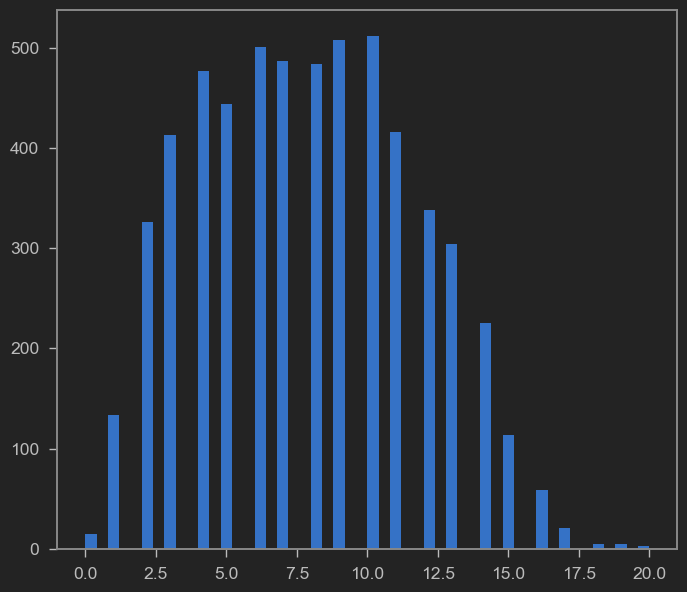

In [60]:
plt.figure()
plt.hist(tweetslength, bins =50)
plt.show()

In [63]:
listofwords = []

for i in stock['Text_Pre-processed']:
    for j in i:
        listofwords.append(j)
        
totalwords  = len(set(listofwords))
totalwords

9268

In [64]:
X = stock['Text_Pre-processed']
y = stock['Sentiment']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [65]:
X_train.shape

(4632,)

In [70]:
X_train

3710    [adding, weight, mtg, sorry, folks, fun, hamme...
4005                                      [ook, breakout]
1470        [closed, calls, looking, reenter, pull, back]
2689                                          [sma, nice]
5191    [new, industry, data, provide, first, hard, lo...
2284                                       [mitk, moving]
508     [wait, see, wschools, jmba, airport, locations...
3320    [eview, open, positions, stocks, aee, asgn, gm...
2231                   [great, think, weve, seen, bottom]
659     [korea, hot, stocksg, display, falls, talks, a...
1164    [vxy, blowout, huge, dump, miss, fed, pump, vx...
3916    [classic, move, testing, cause, webinar, follo...
2489    [morning, follow, best, new, mover, watch, lis...
2141    [jeff, eeves, charles, sizemore, discuss, inke...
614     [mcp, craters, management, tells, biz, sucks, ...
3504       [moving, higher, consolidation, earnings, pop]
3704       [stt, solid, breakout, tight, basing, channel]
2019    [key, 

In [67]:
X_test.shape

(1159,)

In [71]:
X_test

3652                               [vsn, looking, pretty]
3475                                        [still, cool]
743     [hits, hedge, fund, margin, leverage, highest,...
5446    [rupee, slides, paise, hit, alltime, low, doll...
3943     [lot, drip, ticks, long, tail, signals, support]
2920    [dvax, witnessed, record, number, call, put, c...
1746    [people, think, growth, slowing, true, bec, qu...
2545    [want, frame, post, sent, meyou, may, one, rea...
3478    [ceg, exactly, want, see, basing, consolidatin...
1699    [tivo, price, action, check, breaking, volume,...
2577    [canadian, mtyca, much, better, choice, cmg, v...
1431    [vhc, formed, symmetrical, triangle, breakout,...
1085               [green, weekly, triangle, depopdating]
2392          [unp, trade, dvax, fda, approval, decision]
4213             [looks, like, break, month, trend, line]
2008    [solid, trading, mrkt, may, flat, spy, dia, st...
5582    [gapdown, opening, likely, sensex, nifty, amid...
2452    [eal, 

In [73]:
tokenizer = Tokenizer(num_words = totalwords)

tokenizer.fit_on_texts(X_train)

train_sequences = tokenizer.texts_to_sequences(X_train)
test_sequences = tokenizer.texts_to_sequences(X_test)

In [74]:
train_sequences

[[270, 3368, 331, 583, 1017, 886, 584, 28, 63, 462, 1181, 1758, 1],
 [537, 39],
 [280, 78, 29, 1417, 405, 13],
 [134, 11],
 [7,
  378,
  246,
  1759,
  86,
  311,
  74,
  160,
  1182,
  1018,
  117,
  2313,
  1760,
  3369,
  3370],
 [2314, 135],
 [226, 19, 3371, 1761, 3372, 2315, 3373, 3374, 6, 128],
 [2316, 107, 406, 21, 1183, 887, 227, 5, 1019, 129, 888],
 [70, 64, 1418, 538, 95],
 [1762, 312, 3375, 3376, 407, 2317, 123, 1763, 247],
 [281, 2318, 186, 506, 539, 282, 1020, 281, 506],
 [1764, 14, 1021, 1184, 2319, 2320, 634, 124, 1, 57],
 [206, 248, 223, 7, 1419, 8, 72, 2, 249, 85],
 [1765, 3377, 2321, 1022, 2322, 2323, 44, 3378, 129, 43, 3379],
 [196,
  3380,
  889,
  689,
  774,
  3381,
  2324,
  111,
  690,
  271,
  118,
  50,
  95,
  3382,
  3383],
 [135, 16, 233, 44, 178],
 [1766, 298, 39, 355, 1767, 197],
 [207, 356, 635, 1768, 228, 540, 3384, 179, 890, 636, 313, 130],
 [3385, 1185, 1186, 8, 314, 463, 21, 6, 891, 20, 65],
 [379, 1769, 691, 332, 86, 432, 315, 3386, 3387],
 [1420, 1

In [75]:
padded_train = pad_sequences(train_sequences, maxlen=15, padding = 'post', truncating = 'post')
padded_test = pad_sequences(test_sequences, maxlen=15, padding = 'post', truncating = 'post')

In [76]:
y_train_cat = to_categorical(y_train, 2)
y_test_cat = to_categorical(y_test, 2)

y_train_cat.shape
y_test_cat.shape

(1159, 2)

In [77]:
y_test_cat

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [79]:
model = Sequential()

model.add(Embedding(totalwords, output_dim = 512))  # ADDING EMBEDDING LAYER

# BI-DIRECTIONAL RNN AND LSTM
model.add(LSTM(256))

model.add(Dense(128, activation = 'relu')) # ADDING A DENSE LAYER WITH 2 NEURONS AND ACTIVATION FUNCTION AS 'RELU'
model.add(Dropout(0.3)) # REGULARIZATION PARAMETER (TO PREVENT OVERFITTING)

model.add(Dense(2, activation = 'softmax')) # ADDING DENSE LAYER WITH 2 NEURONS AND ACTIVATION FUNCTION AS 'SOFTMAX'
model.compile(optimizer =  'adam', loss = 'binary_crossentropy', metrics = ['acc']) # COMPILING THE MODEL WITH OPTIMIZER - 'ADAM' AND WE WILL BE USING LOSS AS: 'BINARY_CROSSENTROPY' SINCE WE HAVE ONLY 2 CATEGORICAL VARIABLES I.E 0, AND 1 
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [80]:
model.fit(padded_train, y_train_cat, batch_size =32, validation_split=0.2, epochs = 3)

Epoch 1/3
116/116 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - acc: 0.6536 - loss: 0.6360 - val_acc: 0.7422 - val_loss: 0.5448
Epoch 2/3
116/116 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - acc: 0.8773 - loss: 0.3135 - val_acc: 0.7508 - val_loss: 0.5688
Epoch 3/3
116/116 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - acc: 0.9490 - loss: 0.1574 - val_acc: 0.7400 - val_loss: 0.5789


In [81]:
pred = model.predict(padded_test)

prediction  = []
for i in pred:
    prediction.append(np.argmax(i))
    
prediction

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


[1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,


In [82]:
original = []
for i in y_test_cat:
    original.append(np.argmax(i))
    
original

[1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,


In [83]:
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, roc_auc_score, f1_score

accuracy = accuracy_score(original, prediction)
accuracy

0.7765314926660914

In [84]:
f1 = f1_score(original, prediction)
precision = precision_score(original, prediction)
recall = recall_score(original, prediction)
auc = roc_auc_score(original, prediction)

print("f1 for the model is: {}".format(f1))
print("Precision for the model is: {}".format(precision))
print("Recall for the model is: {}".format(recall))
print("AUC for the model is: {}".format(auc))

f1 for the model is: 0.8433151845130067
Precision for the model is: 0.7744444444444445
Recall for the model is: 0.9256308100929614
AUC for the model is: 0.7128154050464808


<Axes: >

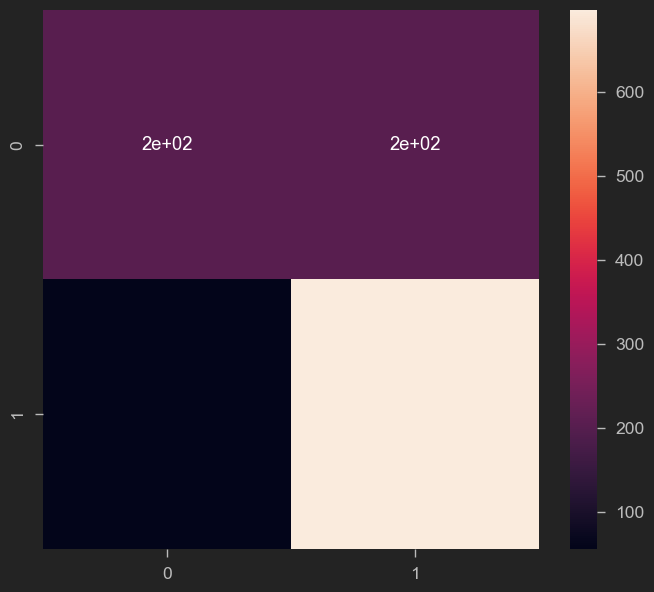

In [85]:
cm = confusion_matrix(original, prediction)

sns.heatmap(cm, annot = True)